In [1]:
import os, time, copy
import numpy as np
import matplotlib.pyplot as plt
from glob import glob
from PIL import Image
from tqdm.auto import tqdm
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, random_split, Subset, DataLoader
from torchvision import datasets, transforms

torch.manual_seed(42)
np.random.seed(42)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

import platform
from matplotlib import font_manager

system = platform.system()
if system == 'Windows':
    # Windows는 맑은 고딕이 기본 내장되어 있어 설치 없이 바로 사용 가능
    plt.rc('font', family='Malgun Gothic')
elif system == 'Darwin':
    # macOS 기본 내장 한글 폰트
    plt.rc('font', family='AppleGothic')
else:
    # Colab 등 Linux: 위 셀에서 설치한 나눔고딕을 등록
    font_dir = '/usr/share/fonts/truetype/nanum'
    font_files = font_manager.findSystemFonts(fontpaths=font_dir)
    for fpath in font_files:
        font_manager.fontManager.addfont(fpath)
    plt.rc('font', family='NanumGothic')

plt.rcParams['axes.unicode_minus'] = False
print('적용된 폰트:', plt.rcParams['font.family'])

cuda
적용된 폰트: ['Malgun Gothic']


# EDA — 중복 이미지 탐지

결측치는 폴더 기반 라벨 구조상 존재할 수 없으므로 논외로 하고, **중복 이미지**를 두 단계로 찾는다.

1. **완전 동일(byte-identical) 중복**: 파일 내용 자체가 100% 같은 경우(복사/재업로드 등). 파일 해시로 찾는다.
2. **근접 중복(near-duplicate)**: 같은 사진을 리사이즈하거나 다시 압축해서 파일 바이트는 다르지만 실질적으로 같은 이미지인 경우. 픽셀을 축소한 평균 해시(average hash)로 찾는다.

둘 다 클래스 폴더를 넘나드는(서로 다른 클래스에 같은 사진이 들어있는) 경우가 있는지도 함께 확인한다 — 있다면 라벨 신뢰도/분할(leakage) 문제로 이어지므로 중요하다.

In [2]:
data_dir = './garbage_classification'
class_names = sorted(os.listdir(data_dir))
all_files = [(c, f) for c in class_names for f in glob(os.path.join(data_dir, c, '*.jpg'))]
print(f'클래스 수: {len(class_names)}개, 전체 파일 수: {len(all_files)}')

클래스 수: 12개, 전체 파일 수: 15515


## 1. 완전 동일(byte-identical) 중복 탐지

In [3]:
# [NEW] 01~07.ipynb에 없는 기법: hashlib — 15,515장을 픽셀 단위로 전부 비교(O(n^2))하는 대신,
# 파일 바이트를 MD5 해시 하나로 요약해 같은 해시끼리 묶으면 완전히 동일한 파일을 O(n)에 찾을 수 있어서 사용한다.
import hashlib
from collections import defaultdict

def file_md5(path, chunk_size=8192):
    h = hashlib.md5()
    with open(path, 'rb') as f:
        for chunk in iter(lambda: f.read(chunk_size), b''):
            h.update(chunk)
    return h.hexdigest()

path_to_md5 = {}
md5_to_files = defaultdict(list)
for c, f in tqdm(all_files, desc='MD5 해시 계산'):
    h = file_md5(f)
    path_to_md5[f] = h
    md5_to_files[h].append((c, f))

exact_dup_groups = [v for v in md5_to_files.values() if len(v) > 1]
n_exact_dup_files = sum(len(g) for g in exact_dup_groups)
print(f'완전 동일 중복 그룹 수: {len(exact_dup_groups)}')
print(f'완전 동일 중복에 속한 파일 수: {n_exact_dup_files}장 (전체의 {n_exact_dup_files/len(all_files)*100:.2f}%)')
print(f'실제로 지워도 되는(그룹당 1장만 남기고) 여분 파일 수: {n_exact_dup_files - len(exact_dup_groups)}장')

MD5 해시 계산:   0%|          | 0/15515 [00:00<?, ?it/s]

완전 동일 중복 그룹 수: 18
완전 동일 중복에 속한 파일 수: 37장 (전체의 0.24%)
실제로 지워도 되는(그룹당 1장만 남기고) 여분 파일 수: 19장


In [4]:
# 서로 다른 클래스 폴더에 걸쳐 완전히 같은 이미지가 들어있는지 확인 (라벨 신뢰도 문제)
cross_class_exact = [g for g in exact_dup_groups if len(set(c for c, f in g)) > 1]
print(f'클래스가 서로 다른 완전 동일 중복 그룹 수: {len(cross_class_exact)}')
for g in cross_class_exact:
    print([(c, os.path.basename(f)) for c, f in g])

클래스가 서로 다른 완전 동일 중복 그룹 수: 3
[('metal', 'metal459.jpg'), ('white-glass', 'white-glass412.jpg')]
[('plastic', 'plastic159.jpg'), ('white-glass', 'white-glass129.jpg')]
[('plastic', 'plastic556.jpg'), ('white-glass', 'white-glass761.jpg')]


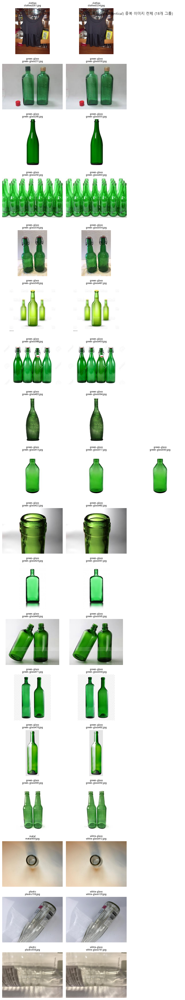

In [5]:
# 완전 동일 중복 그룹 전체 시각화
sample_groups = exact_dup_groups
n_show = max(len(sample_groups), 1)
plt.figure(figsize=(12, 2.6 * n_show))
for gi, g in enumerate(sample_groups):
    for k, (c, f) in enumerate(g[:4]):
        plt.subplot(n_show, 4, gi * 4 + k + 1)
        plt.imshow(Image.open(f))
        plt.title(f'{c}\n{os.path.basename(f)}', fontsize=8)
        plt.axis('off')
plt.suptitle(f'완전 동일(byte-identical) 중복 이미지 전체 ({len(sample_groups)}개 그룹)')
plt.tight_layout()
plt.show()

## 2. 근접 중복(near-duplicate) 탐지

완전 동일 중복은 파일 바이트가 100% 같아야만 잡힌다. 같은 사진을 리사이즈하거나 다시 저장(재압축)한 경우는 바이트가 달라져 위 방법으로는 못 찾는다.

**시행착오**: 처음에는 8x8 평균 해시(average hash)가 같은 파일끼리 묶어봤는데, 이 데이터셋은 흰/밝은 배경에 물체 하나가 중앙에 있는 사진이 많아서 서로 완전히 다른 사진(예: 배터리 vs 갈색 유리병)인데도 전체 밝기 분포가 비슷하다는 이유만으로 같은 해시로 묶이는 오탐이 많았다. 그 후보를 픽셀 평균 차이로 한 번 더 걸러봐도, 배경이 넓고 비슷하면 평균 차이가 작게 나와 여전히 걸러지지 않았다.

그래서 아래 3단계로 다시 설계했다.
1. **구조 기반 해시(dHash)**: 인접 픽셀끼리 밝기가 오르는지/내리는지만 보는 16x16(256비트) difference hash. 배경보다 물체의 윤곽선(구조)에 반응해 aHash보다 훨씬 덜 오탐한다.
2. **Hamming distance로 후보 추출**: 256비트 해시끼리 몇 비트가 다른지(Hamming distance)를 계산해, 아주 조금만(≤5비트, 약 2%) 다른 쌍만 후보로 남긴다. 15,515장을 전부 반복문으로 비교하면 느리므로, `Hamming distance = 각 해시의 1의 개수 합 - 2×내적`이라는 공식으로 행렬곱(numpy)을 이용해 한 번에 계산한다.
3. **픽셀 값으로 최종 확인**: 구조가 비슷한 후보 쌍만 32x32 RGB 픽셀 평균 차이로 다시 확인해 최종 근접 중복 쌍만 남긴다.

In [6]:
# [NEW] 01~07.ipynb에 없는 기법: difference hash(dHash) — 인접 픽셀의 밝기가 오르는지/내리는지(구조)만 보는 해시.
# 위 시행착오에서 확인했듯 이 데이터셋은 평균 밝기(aHash)만으로는 서로 다른 사진이 쉽게 같은 해시로 묶이기 때문에,
# 물체의 윤곽선 구조에 반응하는 dHash로 바꿔 오탐을 줄인다.
def dhash_bits(path, hash_size=16):
    img = Image.open(path).convert('L').resize((hash_size + 1, hash_size), Image.LANCZOS)
    arr = np.asarray(img, dtype=np.float32)
    return (arr[:, 1:] > arr[:, :-1]).flatten().astype(np.float32)  # 오른쪽이 더 밝으면 1

HASH_SIZE = 16
bits = np.zeros((len(all_files), HASH_SIZE * HASH_SIZE), dtype=np.float32)
for i, (c, f) in enumerate(tqdm(all_files, desc='dHash 계산')):
    bits[i] = dhash_bits(f, HASH_SIZE)

print(f'해시 shape: {bits.shape} (파일 수 x {HASH_SIZE*HASH_SIZE}비트)')

dHash 계산:   0%|          | 0/15515 [00:00<?, ?it/s]

해시 shape: (15515, 256) (파일 수 x 256비트)


In [7]:
# [NEW] 01~07.ipynb에 없는 기법: Hamming distance를 행렬곱으로 한 번에 계산 —
# 0/1 벡터 a, b의 Hamming distance = a의 1의 개수 + b의 1의 개수 - 2*(a·b, 즉 둘 다 1인 위치 개수).
# 이 공식을 쓰면 이중 for문 대신 (chunk, 256) x (256, n) 행렬곱으로 여러 쌍의 거리를 한 번에 구할 수 있다.
row_sums = bits.sum(axis=1)
HAMMING_THRESHOLD = 5  # 256비트 중 5비트(약 2%) 이내로 다르면 구조적으로 거의 같은 이미지로 간주

n = len(all_files)
chunk = 1000
hamming_pairs = []
for start in tqdm(range(0, n, chunk), desc='Hamming distance 계산'):
    end = min(start + chunk, n)
    dot = bits[start:end] @ bits.T
    dist = row_sums[start:end, None] + row_sums[None, :] - 2 * dot
    for li in range(end - start):
        i = start + li
        js = np.nonzero(dist[li, i + 1:] <= HAMMING_THRESHOLD)[0] + (i + 1)
        hamming_pairs += [(i, int(j)) for j in js]

print(f'dHash 기준(Hamming distance <= {HAMMING_THRESHOLD}) 근접 중복 후보 쌍 수: {len(hamming_pairs)}')

Hamming distance 계산:   0%|          | 0/16 [00:00<?, ?it/s]

dHash 기준(Hamming distance <= 5) 근접 중복 후보 쌍 수: 93


In [8]:
# 구조(dHash)가 비슷한 후보 쌍만 픽셀 값으로 한 번 더 확인 (오탐 최종 제거)
def resized_rgb(path, size=32):
    img = Image.open(path).convert('RGB').resize((size, size), Image.LANCZOS)
    return np.asarray(img, dtype=np.float32) / 255.0

PIXEL_DIFF_THRESHOLD = 0.05  # 32x32 RGB 평균 절대 차이(0~1 스케일)

rgb_cache = {}
def get_rgb(i):
    if i not in rgb_cache:
        rgb_cache[i] = resized_rgb(all_files[i][1])
    return rgb_cache[i]

verified_pairs = []
for i, j in tqdm(hamming_pairs, desc='픽셀 값으로 최종 검증'):
    if np.abs(get_rgb(i) - get_rgb(j)).mean() < PIXEL_DIFF_THRESHOLD:
        verified_pairs.append((i, j))

print(f'구조(dHash) + 픽셀 값까지 모두 통과한 근접 중복 쌍 수: {len(verified_pairs)} '
      f'(후보 {len(hamming_pairs)}쌍 중)')

픽셀 값으로 최종 검증:   0%|          | 0/93 [00:00<?, ?it/s]

구조(dHash) + 픽셀 값까지 모두 통과한 근접 중복 쌍 수: 89 (후보 93쌍 중)


In [9]:
# 최종 검증을 통과한 쌍들을 Union-Find로 묶어 그룹 구성
class UnionFind:
    def __init__(self, n):
        self.parent = list(range(n))
    def find(self, x):
        while self.parent[x] != x:
            self.parent[x] = self.parent[self.parent[x]]
            x = self.parent[x]
        return x
    def union(self, a, b):
        ra, rb = self.find(a), self.find(b)
        if ra != rb:
            self.parent[ra] = rb

uf = UnionFind(len(all_files))
for i, j in verified_pairs:
    uf.union(i, j)

groups_by_root = defaultdict(list)
for i in range(len(all_files)):
    groups_by_root[uf.find(i)].append(i)

near_dup_groups = [[all_files[i] for i in idxs] for idxs in groups_by_root.values() if len(idxs) > 1]
n_near_dup_files = sum(len(g) for g in near_dup_groups)
print(f'최종 근접 중복 그룹 수: {len(near_dup_groups)}')
print(f'근접 중복에 속한 파일 수: {n_near_dup_files}장')

# 완전 동일 중복(MD5)으로는 못 잡았던, 바이트는 다르지만 근접 중복으로 새로 찾은 것만 추려서 확인
def n_distinct_md5(group):
    return len({path_to_md5[f] for c, f in group})

true_near_dup_groups = [g for g in near_dup_groups if n_distinct_md5(g) > 1]
n_true_near_dup_files = sum(len(g) for g in true_near_dup_groups)
print(f'바이트는 다르지만 근접 중복으로 새로 찾은 그룹 수: {len(true_near_dup_groups)}')
print(f'해당 그룹에 속한 파일 수: {n_true_near_dup_files}장')

cross_class_near = [g for g in true_near_dup_groups if len(set(c for c, f in g)) > 1]
print(f'클래스가 서로 다른 근접 중복 그룹 수: {len(cross_class_near)}')
for g in cross_class_near:
    print([(c, os.path.basename(f)) for c, f in g])

최종 근접 중복 그룹 수: 49
근접 중복에 속한 파일 수: 117장
바이트는 다르지만 근접 중복으로 새로 찾은 그룹 수: 32
해당 그룹에 속한 파일 수: 82장
클래스가 서로 다른 근접 중복 그룹 수: 0


### 2-1. 수동 확인(사람 눈으로 최종 판정)

알고리즘은 후보를 좁혀줄 뿐, '이게 진짜 같은 사진인가'의 최종 판정은 사람 눈으로 확인해야 한다. 위 49개 그룹을 전부 열어본 결과, `trash` 클래스의 7개 그룹(26장)은 **서로 다른 칫솔 제품 사진**인데 '흰 배경 + 세로로 선 칫솔'이라는 제품 사진 특유의 구도가 거의 같아서 구조 해시(dHash)와 픽셀 검증을 둘 다 통과한 오탐으로 확인됐다. 나머지 그룹(마스크·기저귀·유리병·신발 등)은 실제로 같은 사진(반사광 패턴까지 일치)인 것을 확인했다.

전역 threshold를 더 조이는 대신, 확인된 오탐 7개 그룹만 명시적으로 제외한다 — threshold를 조이면 진짜 중복인 다른 클래스(초록 유리병 등)까지 놓칠 위험이 있기 때문.

In [10]:
# 수동으로 확인한 오탐(서로 다른 칫솔 제품, 구도만 같음) 그룹 — 이미지 직접 확인 후 제외
reviewed_false_positive_groups = [
    {'trash357.jpg', 'trash384.jpg', 'trash413.jpg', 'trash437.jpg', 'trash468.jpg', 'trash486.jpg', 'trash544.jpg'},
    {'trash367.jpg', 'trash376.jpg', 'trash409.jpg', 'trash462.jpg', 'trash473.jpg', 'trash514.jpg', 'trash547.jpg', 'trash653.jpg'},
    {'trash421.jpg', 'trash484.jpg', 'trash609.jpg', 'trash631.jpg'},
    {'trash513.jpg', 'trash571.jpg', 'trash652.jpg', 'trash659.jpg'},
    {'trash360.jpg', 'trash488.jpg', 'trash593.jpg'},
    {'trash487.jpg', 'trash564.jpg'},
    {'trash508.jpg', 'trash519.jpg'},
]

def group_basenames(group):
    return {os.path.basename(f) for c, f in group}

is_false_positive = [group_basenames(g) in reviewed_false_positive_groups for g in near_dup_groups]
n_removed_groups = sum(is_false_positive)
n_removed_files = sum(len(g) for g, fp in zip(near_dup_groups, is_false_positive) if fp)

near_dup_groups = [g for g, fp in zip(near_dup_groups, is_false_positive) if not fp]
true_near_dup_groups = [g for g in true_near_dup_groups if group_basenames(g) not in reviewed_false_positive_groups]

print(f'수동 확인으로 제외한 오탐 그룹 수: {n_removed_groups}개 ({n_removed_files}장)')
print(f'검토 후 최종 근접 중복 그룹 수: {len(near_dup_groups)}개 ({sum(len(g) for g in near_dup_groups)}장)')
print(f'검토 후 근접 중복 중 바이트가 다른 그룹 수: {len(true_near_dup_groups)}개 ({sum(len(g) for g in true_near_dup_groups)}장)')

수동 확인으로 제외한 오탐 그룹 수: 7개 (30장)
검토 후 최종 근접 중복 그룹 수: 42개 (87장)
검토 후 근접 중복 중 바이트가 다른 그룹 수: 25개 (52장)


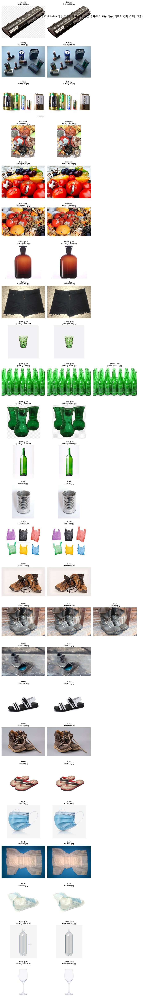

In [11]:
# 검증된 근접 중복(바이트는 다름) 전체 시각화
sample_groups = true_near_dup_groups
n_show = max(len(sample_groups), 1)
plt.figure(figsize=(12, 2.6 * n_show))
for gi, g in enumerate(sample_groups):
    for k, (c, f) in enumerate(g[:4]):
        plt.subplot(n_show, 4, gi * 4 + k + 1)
        plt.imshow(Image.open(f))
        plt.title(f'{c}\n{os.path.basename(f)}', fontsize=8)
        plt.axis('off')
plt.suptitle(f'구조(dHash)+픽셀 검증까지 통과한 근접 중복(바이트는 다름) 이미지 전체 ({len(sample_groups)}개 그룹)')
plt.tight_layout()
plt.show()

## 3. 요약

**완전 동일(byte-identical) 중복 — 셀 4, 5**

- 18개 그룹, 37장(전체 15,515장의 0.24%)이 중복. 그룹당 1장만 남긴다면 19장을 지울 수 있다.
- 클래스가 서로 다른 완전 동일 중복 그룹 3개 발견: `metal`↔`white-glass`, `plastic`↔`white-glass`(2건). 같은 사진이 서로 다른 라벨로 들어가 있다는 뜻이라 라벨 신뢰도 문제다.

**근접 중복(near-duplicate) — 셀 8~11, 수동 확인 셀 12~13**

- 처음 시도한 8x8 평균 해시(aHash) 방식은 실패했다: 이 데이터셋은 흰/밝은 배경에 물체 하나가 중앙에 있는 사진이 많아서, 완전히 다른 사진(배터리 vs 유리병 등)도 전체 밝기 분포가 비슷하면 같은 해시로 묶였다.
- **dHash(구조 기반, 256비트) + Hamming distance(≤5비트) + 32x32 픽셀 검증(평균 차이 <0.05)** 3단계로 바꾼 뒤 알고리즘 기준 49개 그룹(117장)을 찾았다.
- **그래도 알고리즘만으로는 부족했다**: 49개 그룹을 전부 눈으로 확인한 결과, `trash` 클래스의 **7개 그룹(30장)은 실제로는 서로 다른 칫솔 제품 사진**이었다 — "흰 배경 + 세로로 선 칫솔"이라는 제품 사진 특유의 구도가 거의 같아서 구조 해시와 픽셀 검증을 모두 통과한 오탐. 나머지 그룹(마스크·기저귀·유리병·신발 등)은 반사광 패턴까지 일치하는 진짜 중복임을 확인했다.
- 전역 threshold를 더 조이는 대신(다른 클래스의 진짜 중복까지 놓칠 위험이 있음), **확인된 오탐 7개 그룹만 명시적으로 제외**했다. 검토 후 최종: 근접 중복 42개 그룹(87장), 이 중 완전 동일 중복(MD5)으로는 못 잡는 새 발견분은 25개 그룹(52장).
- 클래스가 서로 다른 근접 중복 그룹은 0개.

**정리**

- 확실한 중복(완전 동일 37장 + 검증·수동 확인까지 마친 근접 중복 52장)은 전체의 약 0.6%(89장)로, 15,515장 규모에서 학습 결과를 크게 왜곡할 정도는 아니지만 무시할 수준도 아니다.
- 특히 완전 동일 중복 중 **클래스가 다른 3개 그룹**은 반드시 처리가 필요하다(같은 사진이 두 클래스에 동시에 라벨링되어 있으면 어느 한쪽은 오답).
- 근접 중복은 **클래스 내부에서만** 발생했으므로, 그대로 두면 "같은 사진이 여러 번 학습/검증/평가에 들어가는" data leakage 위험(특히 같은 사진의 서로 다른 워터마크 버전이 train과 val/test로 갈라져 들어가면 검증 점수가 실제보다 부풀려질 수 있음)이 남아있다.
- **자동 탐지의 한계**: 해시 기반 방법은 후보를 좁혀줄 뿐이고, 제품 사진처럼 구도가 규격화된 카테고리(이번엔 칫솔)에서는 사람이 직접 눈으로 최종 확인해야 한다는 것을 확인했다.
- **다음 단계**: 완전 동일 중복은 그룹당 1장만 남기고, (수동 검토를 마친) 근접 중복은 같은 그룹에 속한 파일들이 반드시 같은 split(train/val/test 중 하나)에만 들어가도록 분할 로직을 수정한 뒤 `1.ipynb` 파이프라인을 다시 돌려 성능 차이를 비교한다.


## 4. 라벨 오류 의심 사례 검토

`1.ipynb`에서 학습한 모델로 held-out(val+test, 4,655장)과 train(2-fold out-of-fold, 10,838장)을 각각 진단해 확신도(softmax 확률) 0.9~0.7 이상으로 틀린 예측 총 232건을 1차로 자동 추출한 뒤, **232건을 전부 육안으로 재검토**해 최종 확정했다. 전체 목록과 판정 근거는 `label_review_report.md`에 정리했고, 여기서는 카테고리별로 실제 이미지를 다시 띄워서 확인한다.

- **A. 확실한 라벨 오류** — `clothes ↔ shoes` 44건, `shoes`로 이동
- **B. 추가 확인된 오류** — 2건(색상/재질), 각각 정정 필요
- **C. 애매한 경계 사례** — 3건, 보류(팀 논의 필요)
- **D. 사진이 아닌 이미지** — 6건, 보류(데이터셋 제외 여부 논의)

In [12]:
# label_review_report.md의 카테고리별 목록 — (현재 폴더, 파일명, 메모)
# 사람 육안 재검토(2026-09-05)로 최종 확정된 버전 — clothes2073/clothes1150/plastic351/
# green-glass181/plastic851/white-glass64/paper578은 라벨이 맞아 E로, clothes526은 C로,
# white-glass704/paper9는 오류가 맞다고 확정되어 B로 재분류됨.
category_A1 = [
    ('clothes', 'clothes3062.jpg', ''), ('clothes', 'clothes3330.jpg', ''),
    ('clothes', 'clothes5002.jpg', ''), ('clothes', 'clothes2197.jpg', ''),
    ('clothes', 'clothes4465.jpg', ''), ('clothes', 'clothes1229.jpg', ''),
    ('clothes', 'clothes2272.jpg', ''),
    ('clothes', 'clothes791.jpg', ''), ('clothes', 'clothes4836.jpg', ''),
    ('clothes', 'clothes5277.jpg', ''), ('clothes', 'clothes5181.jpg', ''),
    ('clothes', 'clothes3623.jpg', ''), ('clothes', 'clothes3807.jpg', ''),
    ('clothes', 'clothes451.jpg', ''), ('clothes', 'clothes2162.jpg', ''),
    ('clothes', 'clothes4329.jpg', ''), ('clothes', 'clothes255.jpg', ''),
    ('clothes', 'clothes559.jpg', ''),
    ('shoes', 'shoes1826.jpg', '반바지 사진 (반대 방향)'),
]

category_A2 = [
    ('clothes', f, '') for f in [
        'clothes2185.jpg', 'clothes4319.jpg', 'clothes4611.jpg', 'clothes5201.jpg',
        'clothes2556.jpg', 'clothes1015.jpg', 'clothes82.jpg', 'clothes3374.jpg',
        'clothes4466.jpg', 'clothes4635.jpg', 'clothes2334.jpg',
        'clothes2654.jpg', 'clothes4150.jpg', 'clothes1312.jpg', 'clothes4293.jpg',
        'clothes2733.jpg', 'clothes53.jpg', 'clothes3206.jpg', 'clothes5045.jpg',
        'clothes1444.jpg', 'clothes4495.jpg', 'clothes4469.jpg', 'clothes3895.jpg',
        'clothes1582.jpg']
] + [('clothes', 'clothes3545.jpg', '모델은 metal로 예측했지만 육안상 명백한 장화')]

category_B = [
    ('white-glass', 'white-glass704.jpg', '사용자 확인: green-glass가 맞음 -> 정정 필요'),
    ('paper', 'paper9.jpg', '사용자 확인: 비닐봉투(plastic)가 맞음 -> 정정 필요'),
]

category_C = [
    ('white-glass', 'white-glass58.jpg', '여러 병이 섞여있어 판단 애매'),
    ('shoes', 'shoes379.jpg', '하이힐 모양 유리 장식품 -> 진짜 애매함'),
    ('clothes', 'clothes526.jpg', '사진 내용을 알아보기 어려움'),
]

category_D = [
    ('trash', 'trash223.jpg', '마스크 클립아트 일러스트'),
    ('plastic', 'plastic605.jpg', '플라스틱 병 연필 스케치'),
    ('white-glass', 'white-glass112.jpg', '깨진 유리 클립아트'),
    ('metal', 'metal502.jpg', '캔 목업 템플릿(워터마크 있음)'),
    ('green-glass', 'green-glass372.jpg', '병 목업 템플릿(워터마크 있음)'),
    ('shoes', 'shoes1878.jpg', '스타일라이즈된 부츠 렌더링(라벨 자체는 맞음)'),
]

def show_category(items, title, per_page=12):
    n_pages = (len(items) + per_page - 1) // per_page
    for p in range(n_pages):
        chunk = items[p * per_page:(p + 1) * per_page]
        rows = (len(chunk) + 3) // 4
        plt.figure(figsize=(16, 4 * rows))
        for k, (cls, fname, note) in enumerate(chunk):
            img = Image.open(os.path.join(data_dir, cls, fname))
            plt.subplot(rows, 4, k + 1)
            plt.imshow(img)
            cap = f'{fname}\n[{cls}]'
            if note:
                cap += f'\n{note}'
            plt.title(cap, fontsize=8)
            plt.axis('off')
        page_str = f' ({p + 1}/{n_pages})' if n_pages > 1 else ''
        plt.suptitle(f'{title}{page_str}')
        plt.tight_layout()
        plt.show()

print(f'A1 {len(category_A1)} / A2 {len(category_A2)} / B {len(category_B)} / '
      f'C {len(category_C)} / D {len(category_D)}')

A1 19 / A2 25 / B 2 / C 3 / D 6


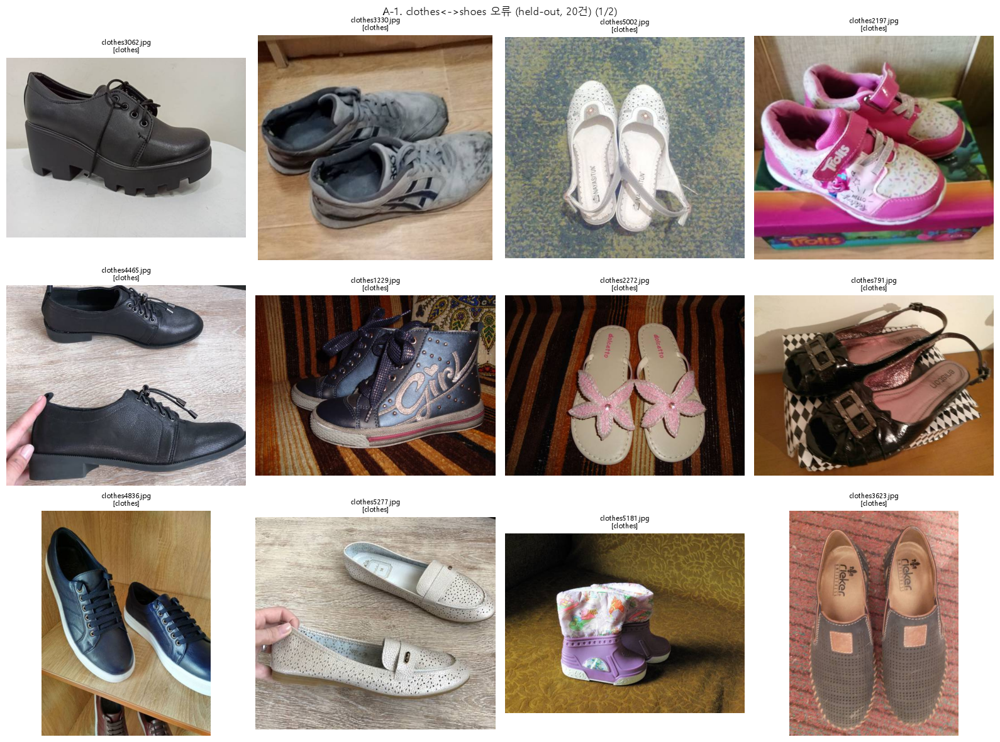

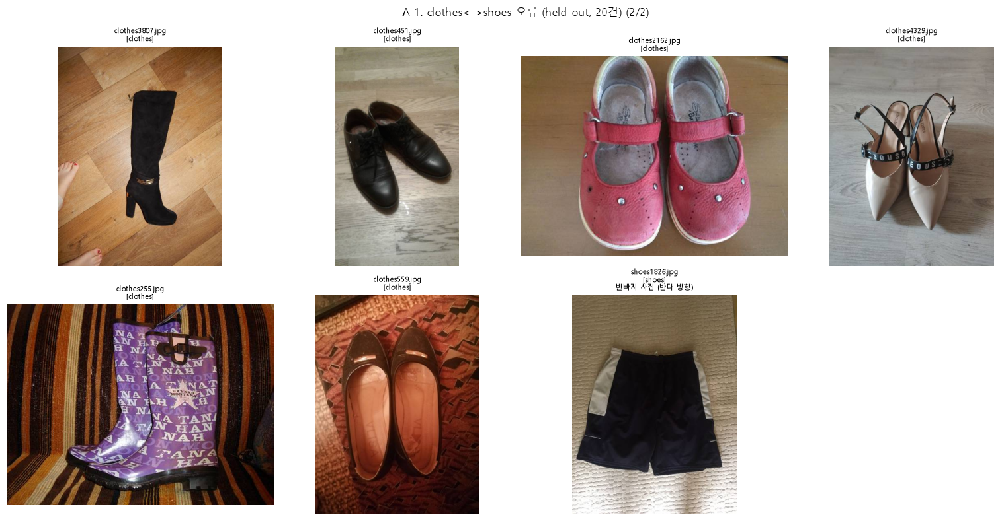

In [13]:
show_category(category_A1, 'A-1. clothes<->shoes 오류 (held-out, 20건)')

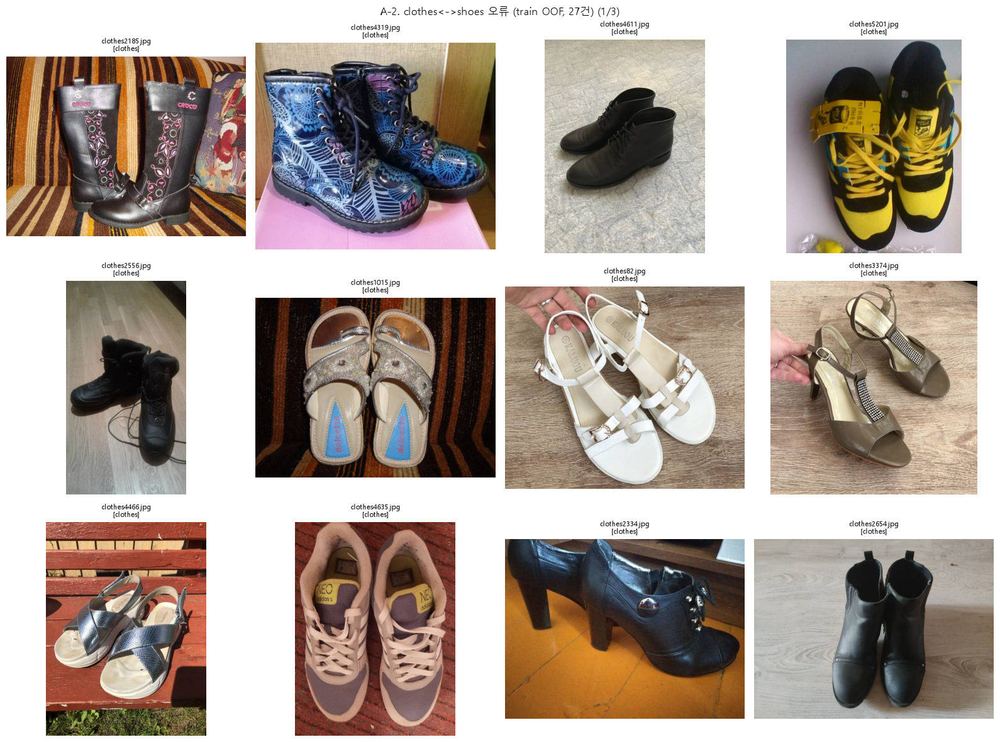

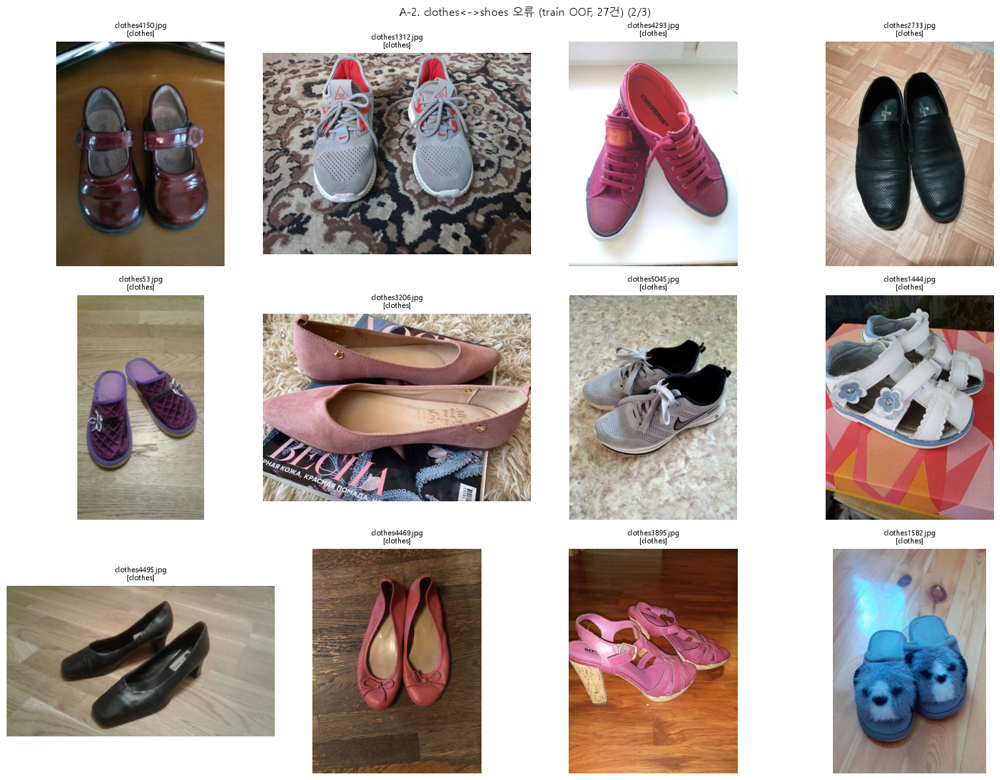

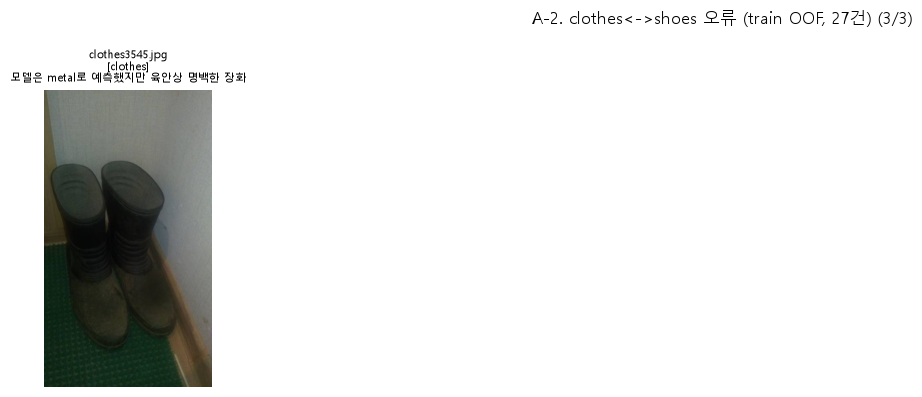

In [14]:
show_category(category_A2, 'A-2. clothes<->shoes 오류 (train OOF, 27건)')

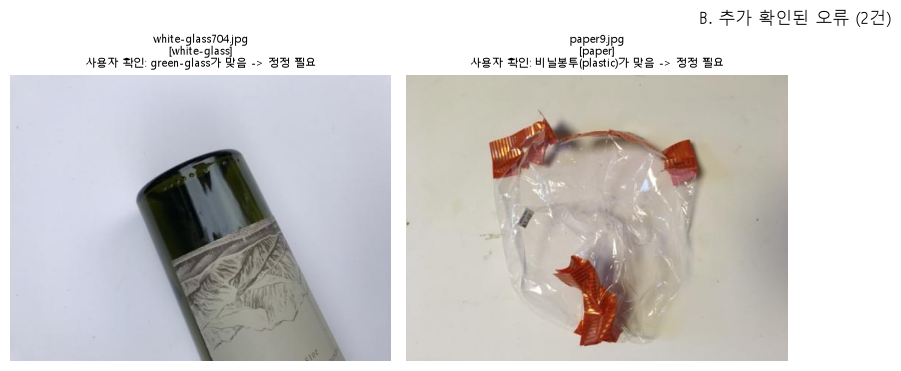

In [15]:
show_category(category_B, 'B. 추가 확인된 오류 (2건)')

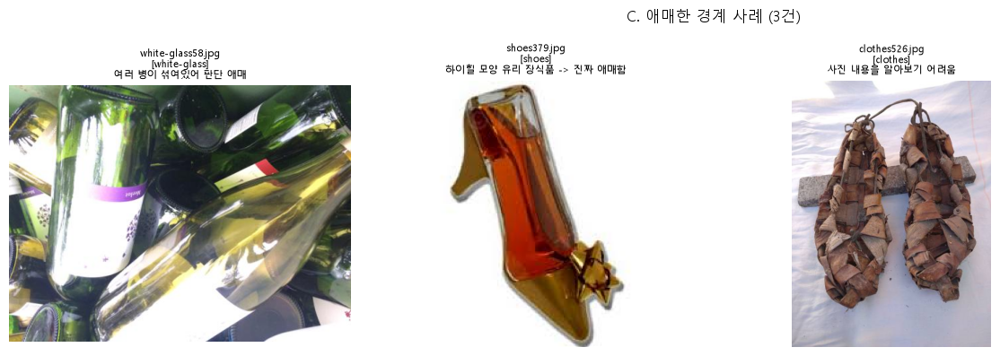

In [16]:
show_category(category_C, 'C. 애매한 경계 사례 (3건)')

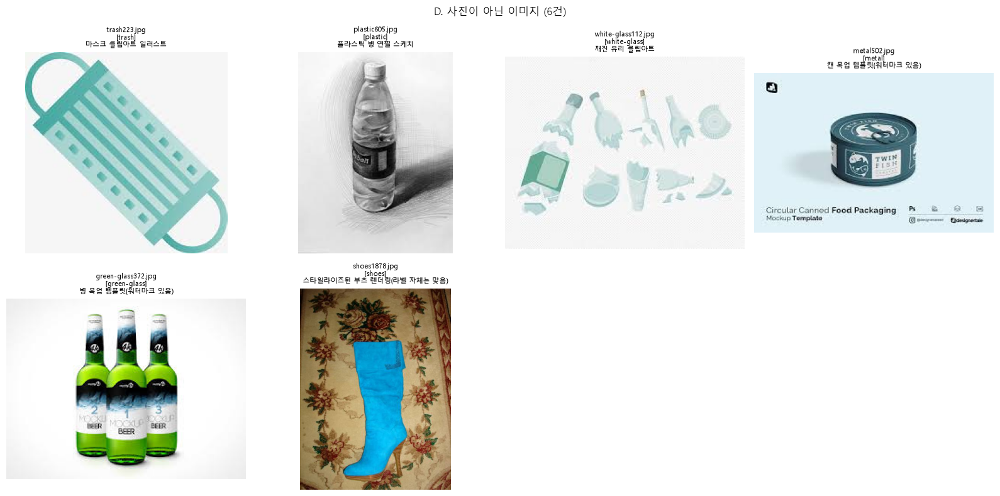

In [17]:
show_category(category_D, 'D. 사진이 아닌 이미지 (6건)')